<a href="https://colab.research.google.com/github/LtheWhitehat/coding-projects/blob/master/geodiff.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [81]:
!pip install scikit-learn
!pip install earthpy
!pip install gdal
!pip install rasterio

In [82]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import earthpy.plot as ep
import rasterio
import numpy as np
from matplotlib import cm
import plotly.graph_objects as go

In [83]:
#@title CELL 4 - plot function
# define a function to plot rasters
def plotraster(data, nd, v_min, v_max, cmap='Blues'):
    data = np.ma.masked_array(data, mask = (data <= nd))
    pyplot.figure(figsize=(12,6))
    pyplot.imshow(data, extent=grid.extent, cmap=cmap, vmin=v_min, vmax=v_max)
    pyplot.colorbar()
    pyplot.gridQ()

In [84]:
# -*- coding: utf-8 -*-
"""
Created on Wed May 13 15:48:06 2020

@author: shunan feng
"""
import numpy as np

def getxy(rasterfile):
  """
  getxy is used for getting the x and y coordinates of the rasterfile.

  Parameters
  ----------
  [rasterfile]: variable read by rasterio

  Returns
  -------
  [x,y]: the x, y coordinates of the input

  e.g.
  import rasterio
  src = rasterio.open('image.tif')
  x, y = getxy(src)
  """
  rasterbound = rasterfile.bounds
  x = np.linspace(rasterbound.left, rasterbound.right, rasterfile.width)
  y = np.linspace(rasterbound.bottom, rasterbound.top, rasterfile.height)
  return x, y

In [85]:
src = rasterio.open(r'relevo_tijuca.tif')
band1 = src.read(1)

getxy # personal function
x, y = getxy(src)
X, Y = np.meshgrid(x,y)


<Figure size 640x480 with 0 Axes>

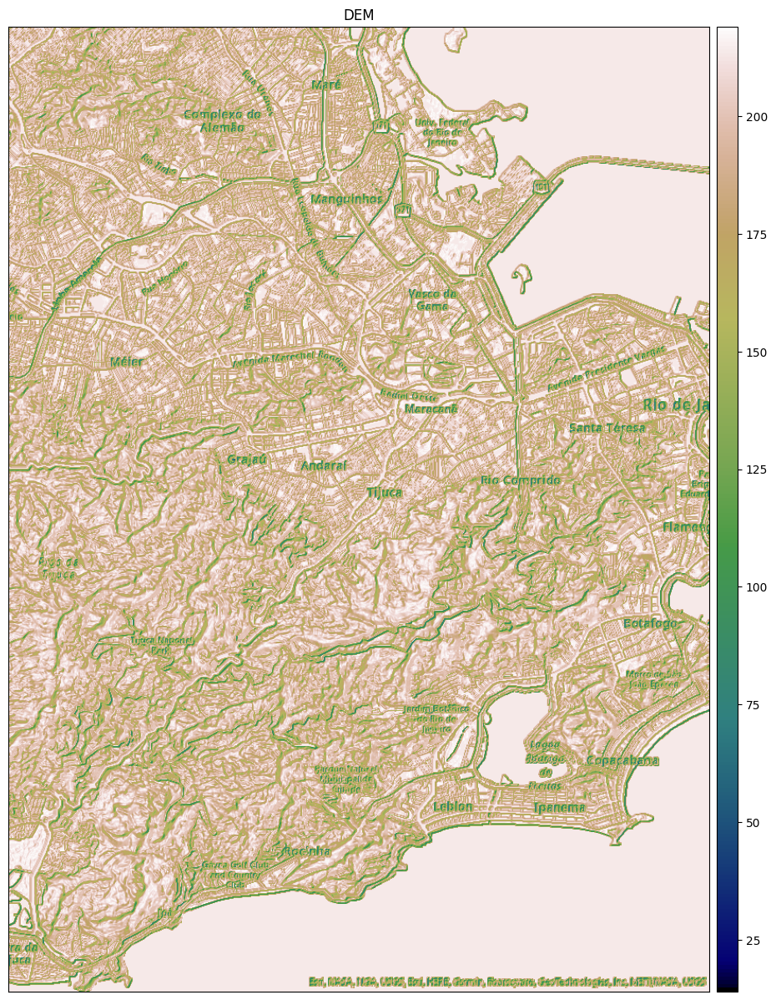

In [86]:
fig = plt.figure()
ep.plot_bands(
    band1,
    cmap="gist_earth",
    title="DEM",
    figsize=(20,15),
)
plt.show()

In [91]:
import numpy as np
from osgeo import gdal

# Open the raster dataset
raster_path = 'tijuca.tif'
dataset = gdal.Open(raster_path)

# Get raster information
band = dataset.GetRasterBand(1)
width = dataset.RasterXSize
height = dataset.RasterYSize
geotransform = dataset.GetGeoTransform()
projection = dataset.GetProjection()

# Read raster data as a numpy array
raster_data = band.ReadAsArray()

# Define flood threshold and flood level
flood_threshold = 100  # Adjust as needed
flood_level = 150  # Adjust as needed

# Simulate flooding
flooded_cells = np.where(raster_data > flood_threshold)
raster_data[flooded_cells] = flood_level


In [ ]:
!pip install pysheds

In [89]:
from pysheds.grid import Grid
from pysheds.rfsm import RFSM
import matplotlib.pyplot as plt
import numpy as np
import rasterio

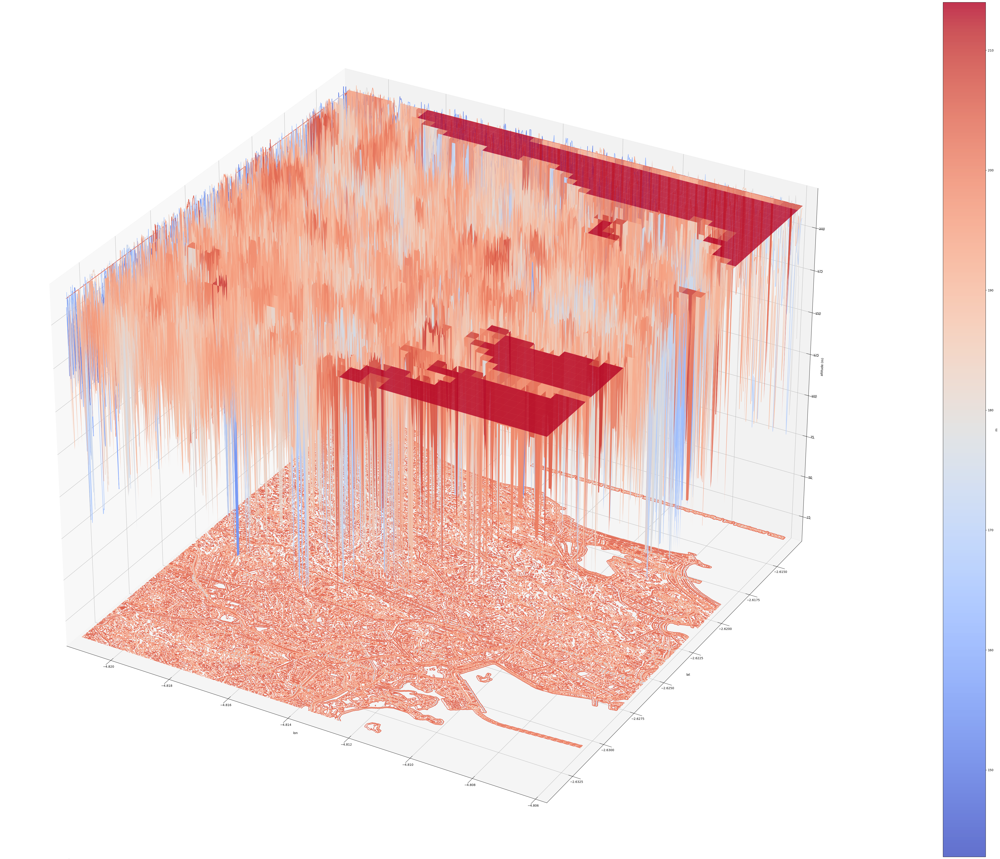

In [96]:
fig = plt.figure(figsize=(100,50))
ax = fig.add_subplot(projection='3d')
# ax.plot_surface(X, Y, band1, rstride=8, cstride=8, alpha=0.3)
surf = ax.plot_surface(X, Y, band1,  cmap=cm.coolwarm, alpha=0.8)
cset = ax.contour(X, Y, band1, zdir='z', offset=band1.min(), cmap=cm.coolwarm)
cset = ax.contour(X, Y, band1, zdir='x', offset=min(x), cmap=cm.coolwarm)
cset = ax.contour(X, Y, band1, zdir='y', offset=max(y), cmap=cm.coolwarm)

ax.set_xlabel('lon')
ax.set_xlim(min(x), max(x))
ax.set_ylabel('lat')
ax.set_ylim(min(y), max(y))
ax.set_zlabel('altitude (m)')
ax.set_zlim(np.nanmin(band1), np.nanmax(band1))
colo = fig.colorbar(surf)
colo.ax.set_ylabel('m')
plt.show()

In [ ]:
fig = go.Figure(data=go.Surface(
    x=X,
    y=Y,
    z=band1,
    colorbar=dict(title="Elevation (m)")
    ))

fig.update_traces(contours_z=dict(show=True, usecolormap=True,
                                  highlightcolor="limegreen", project_z=True))
fig.update_layout(title='Reservoir 3d View', autosize=False,height=500,width=800)
fig.show()
fig.write_html(r"dataVisualHTML\dem3d.html")